In [2]:
import pandas as pd 
import pickle 
import numpy as np 
from matplotlib.lines import Line2D
import mpl_toolkits.mplot3d as a3
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch as th
import plotly.graph_objects as go
sns.set_style('whitegrid')

sns.set_context('notebook')

%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import sys
root =  '/home/ubuntu/ext_vol'
sys.path.insert(0, f'{root}/inpca')
from utils import plotly_3d, get_idx, CDICT_M

/home/ubuntu/miniconda3/envs/inpca/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /home/ubuntu/miniconda3/envs/inpca/lib/python3.9/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKSs
  warn(f"Failed to load image Python extension: {e}")


In [4]:
data_root = f'{root}/inpca/notebooks/data'

# Validation to Training Plot

In [5]:
validation_2_training_ds  = pickle.load(open(os.path.join(data_root, 'valid2train_data.p'),'rb'))
xp_train = validation_2_training_ds['xp_train']
xp_valid_project = validation_2_training_ds['xp_valid_project']
m_color = validation_2_training_ds['m_color']

In [7]:
didx = th.load(f'{root}/inpca/inpca_results_all/didx_geod_all_progress.p')
ii = get_idx(didx, "bs=='200' & aug=='none' & wd=='0.0' & m != 'wr-16-4-64' & opt=='sgd'")
didx = didx.iloc[ii].reset_index(drop=True)

In [15]:
# params for plotting
m_c  = {'allcnn': np.array([0.70285846, 0.79622919, 0.7814517 ]),
 'fc': np.array([0.45234079, 0.16555418, 0.071493  ]),
 'wr-10-4-8': np.array([0.91763101, 0.00539246, 0.49168774]),
 'vit': np.array([0.2873541 , 0.58912797, 0.9247179 ]),
 'convmixer': np.array([0.40839386, 0.49308246, 0.80048501])}

c_m = {tuple(value):key for (key, value) in m_c.items()}
ms = [c_m[tuple(m_color[i][0])] for i in range(len(m_color))]
dd=pd.DataFrame((ms+['geodesic']*67)*2, columns=['m'])
dd['data'] = ['train'] * 3417 + ['test'] * 3417
r = {
    'xp': np.vstack([xp_train[:, :3], xp_valid_project[:, :3]]),
    'e':np.arange(3),
}

from copy import deepcopy
rtrain = deepcopy(r)
rtrain['xp'] = r['xp'][:3417, :]

import matplotlib.colors as mc
c2 = [mc.to_hex(c) for c in plt.get_cmap('tab20').colors[1:10:2]] + ['#7f7f7f']
CDICT_2 = {m:c2[i] for (i, m) in enumerate(['convmixer', 'wr-10-4-8', 'fc', 'allcnn', 'vit', 'geodesic'])}

In [17]:
f=plotly_3d(dd.reset_index(), r=r, color='m',discrete_c=True, 
            grid_corners = [[-1, -1, -1], [0.3, 0.2, 0.5]],
            cdict=CDICT_M)
for i in range(3):
    dd[f'x{i+1}'] = r['xp'][:, i]
f.add_trace(
            go.Scatter3d(
                x=dd[dd.data=='test']['x1'],
                y=dd[dd.data=='test']['x2'],
                z=dd[dd.data=='test']['x3'],
                marker=dict(
                    size=4,
                    opacity=0.9,
                    symbol='circle',
                    color=dd[dd.data=='test'].m.map(CDICT_2),
                    
                ),
                mode='markers',
                showlegend=False,
            )
    
        )

camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0.0, z=0.3),
    eye=dict(x=0.65, y=0.85, z=1.05)
)
f.update_layout(scene_camera=camera)
f.show()
print(r['e'])

[0 1 2]


[0 1 2]


# Subsampled Embedding Explained Pairwise Distance Plot

In [18]:
# rel_error_all_= pickle.load(open(r'C:\Users\Itay\Documents\ipcaLocal\validation training embedidng\subsampling figures\train_subsample_err_all.p','rb'))
fn = 'train'
rel_error_all_= pickle.load(open(os.path.join(data_root, f'{fn}_subsample_err_all.p'),'rb'))
ns = [10, 100, 1000] if fn == 'test' else [50, 500, 5000]

ds = pd.DataFrame(rel_error_all_[ns[0]].T[:, [0, -1]], columns=['dimension', 4])
ds = ds.reset_index(drop=True).melt(id_vars='dimension')
for (i,s) in enumerate(ns):
    tmp = rel_error_all_[s]
    tmp_ds = pd.DataFrame(tmp.T[:, :2], columns=['dimension',
                                          i])
    tmp_ds  = tmp_ds.reset_index().melt(id_vars='dimension', 
                                        value_vars=[i])
    ds = pd.concat([ds, tmp_ds])

In [6]:
fn = 'train'
rel_err= pickle.load(open(os.path.join(data_root, 'test_project_train_rel_err.p'),'rb'))

[(0.5, 0.86),
 Text(0.5, 0, '# Dimensions'),
 Text(0, 0.5, 'Explained Pairwise Distance')]

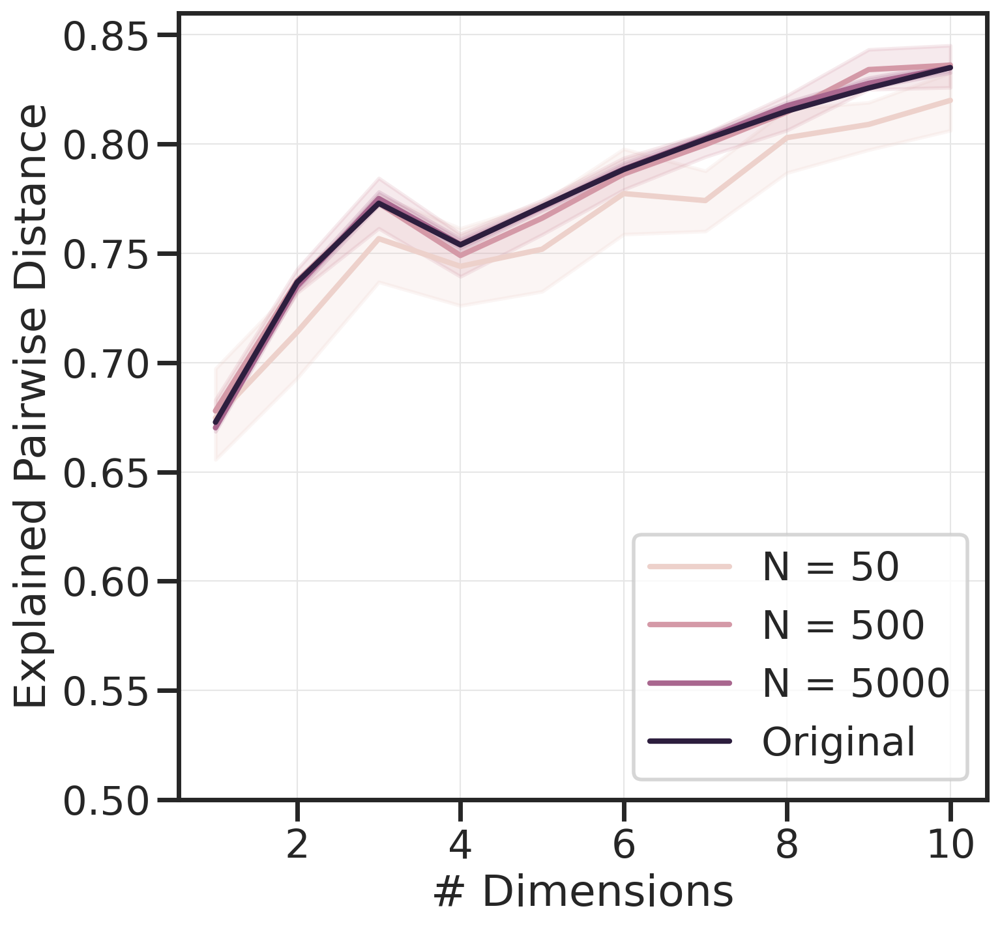

In [281]:
f, ax=plt.subplots(figsize=(8, 8))
ylims = (0.5, 0.86) if fn == 'train' else (0.13, 0.58)
sns.lineplot(data=ds.reset_index(), x='dimension', y='value', hue='variable',ax=ax)
legend_handles, _= ax.get_legend_handles_labels()
ax.legend(legend_handles, [f'N = {s}' for s in ns] + ['Original'], loc='lower right')
ax.set(ylim=ylims, xlabel='# Dimensions', ylabel='Explained Pairwise Distance')

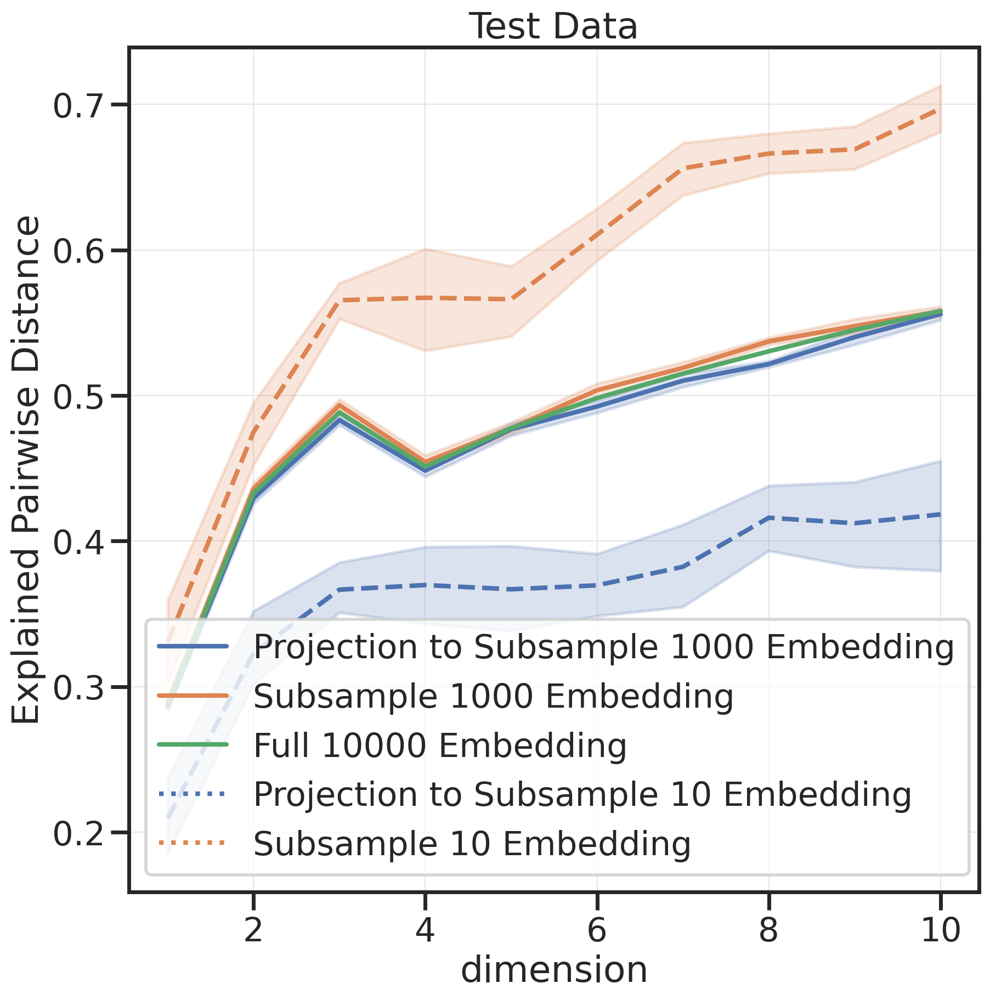

In [18]:
rel_error_all_test_ = pickle.load(open(os.path.join(data_root, 'test_subsample_err_all.p'),'rb'))

s=1000
tmp = rel_error_all_test_[s]

tmp_ds = pd.DataFrame(tmp.T, columns=['dimension','Projection to Subsample 1000 Embedding','Subsample 1000 Embedding', 'Full 10000 Embedding'])
tmp_ds  = tmp_ds .reset_index().melt(id_vars='dimension', value_vars=['Projection to Subsample 1000 Embedding','Subsample 1000 Embedding', 'Full 10000 Embedding'])

sns.lineplot(data=tmp_ds, x='dimension', y='value', hue='variable',markers=True, dashes=False).set(title='Test Data')

s=10
tmp = rel_error_all_test_[s]

tmp_ds = pd.DataFrame(tmp.T, columns=['dimension','Projection to Subsample 10 Embedding','Subsample 10 Embedding', 'Full 10000 Embedding'])
tmp_ds  = tmp_ds .reset_index().melt(id_vars='dimension', value_vars=['Projection to Subsample 10 Embedding','Subsample 10 Embedding'])

ax =sns.lineplot(data=tmp_ds, x='dimension', y='value', hue='variable', linestyle='dashed')
ax.set_ylabel('Explained Pairwise Distance')
leg = ax.legend()
leg_lines = leg.get_lines()
leg_lines[3].set_linestyle(":")
leg_lines[4].set_linestyle(":")

# isKL plot

In [19]:
iskl_plot_ds = pickle.load(open(os.path.join(data_root, 'iskl_ds.p'),'rb'))

xp_skl= iskl_plot_ds['xp'] 
e_skl = iskl_plot_ds['e'] 
geo_traj = iskl_plot_ds['truth_traj']
r = {'xp': np.vstack([xp_skl, geo_traj]), 'e':e_skl}

In [20]:
dd = dd.iloc[:3417]

In [21]:
f=plotly_3d(dd.reset_index(), r=r, 
            color='m',discrete_c=True, cdict=CDICT_M, color_axis=True,
            grid_corners=[[-2.75, 1, -1], [2.1,-1.5,0.5]],
            xrange=[-2.75, 3.], yrange=[-2.75, 1], zrange=[-1, 1])
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0.75, y=0.0, z=0.25),
    eye=dict(x=2.55, y=-3.25, z=2.5)
)
f.update_layout(scene_camera=camera)

f.show()

[ 5.30267860e+03 -3.97283058e+02  2.57875635e+02 ... -1.64842623e-09
 -3.48959123e-10  5.91093476e-15]
